In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [3]:
import torch
import librosa
import pickle
import librosa.display
from rethink.preprocess import *
from rethink.stft.torchlibrosa import LibrosaMelSpectrogram 
import matplotlib.pyplot as plt
import torchaudio.transforms as TA_T
from torchvision.transforms import Compose
import numpy as np
from audiomentations import AddBackgroundNoise, PolarityInversion, AddGaussianNoise, PitchShift, AddGaussianSNR
from IPython.display import Audio, display

In [4]:
def load_audio(path):
    loader = Loader(sample_rate=22050)
    trimmer = Trimmer(sample_rate=22050, duration=10)
    padder = Padder(sample_rate=22050, duration=10)

    signal = loader(path)
    signal = trimmer(signal)
    signal = padder(signal)

    return signal

In [6]:
tmp_data = []
pkls = ["/media/magalhaes/sound/spectograms/TimeMasking0/sound_1695725868_split1.pkl"]
for pkl_dir in pkls:
    with open(pkl_dir, "rb") as f:
        tmp_data.extend(pickle.load(f))

tmp_data = np.array(tmp_data)

In [7]:
tmp_data

array([{'augmented': False, 'filename': '/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_18_54.006322+00_00.wav', 'spectograms': array([[[2.0718355 , 1.6942161 , 2.0316448 , ..., 1.9968144 ,
                2.069351  , 1.8071682 ],
               [2.1041565 , 1.6986707 , 2.059403  , ..., 2.2364619 ,
                2.3079345 , 2.1037261 ],
               [2.102449  , 1.771613  , 2.0550687 , ..., 2.3513596 ,
                2.3971326 , 2.2363117 ],
               ...,
               [0.13841462, 0.18605009, 0.19195624, ..., 1.3250064 ,
                1.2104245 , 1.1923469 ],
               [0.25231168, 0.19984809, 0.2893055 , ..., 1.235989  ,
                1.4675008 , 1.2014941 ],
               [0.4418392 , 0.3673372 , 0.5092634 , ..., 1.2427561 ,
                1.4393265 , 1.2034779 ]],

              [[2.0861824 , 2.1675248 , 2.1505182 , ..., 2.0057685 ,
                1.9193906 , 2.3838627 ],
               [2.203075  , 2.0696323 , 2.079643  , ..., 2.3557155 ,
         

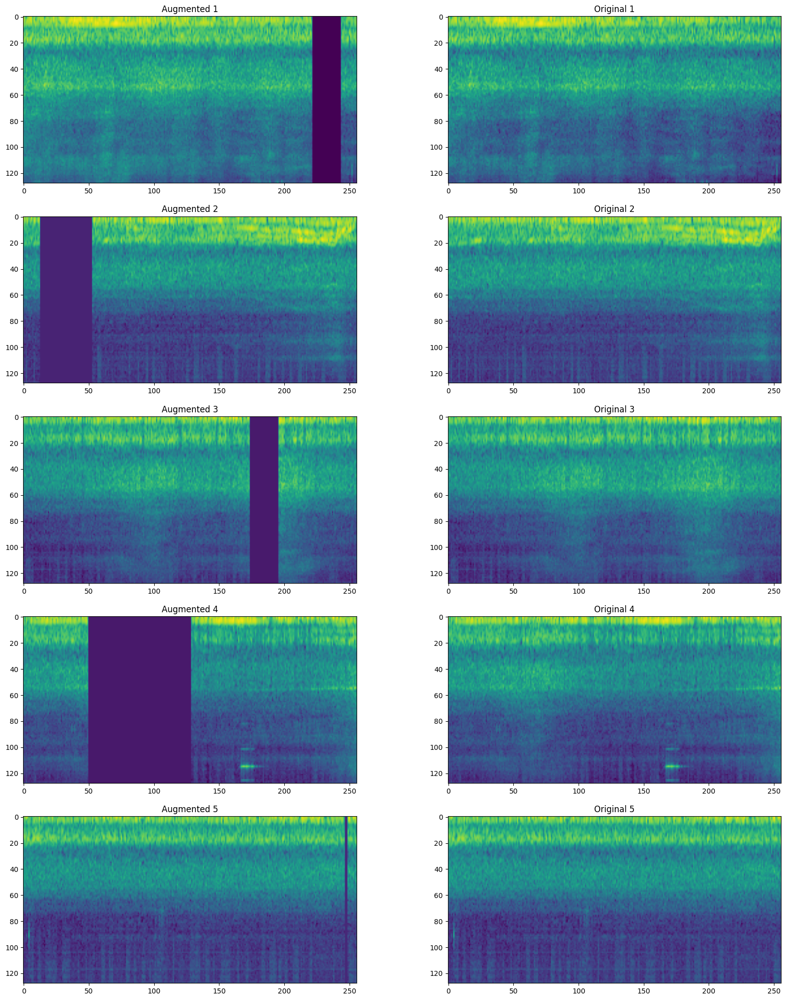

In [11]:
# Define the value of N
N = 5  # Change this value to the desired number of entries

augmented_entries = []
original_entries = []

# Find the first N augmented entries
count = 0
for entry in tmp_data:
    if entry["augmented"]:
        augmented_entries.append(entry)
        count += 1
    if count == N:
        break

# Find the corresponding original entries
for augmented_entry in augmented_entries:
    for entry in tmp_data:
        if entry["filename"] == augmented_entry["filename"]:
            original_entries.append(entry)
            break

# Show the spectrograms side by side for the first N augmented entries and their corresponding original entries
fig, axes = plt.subplots(N, 2, figsize=(20, 5 * N))

for i in range(N):
    augmented_spec = augmented_entries[i]["spectograms"]
    original_spec = original_entries[i]["spectograms"]
    
    axes[i, 0].imshow(augmented_spec[0])
    axes[i, 0].set_title(f"Augmented {i + 1}")
    
    axes[i, 1].imshow(original_spec[0])
    axes[i, 1].set_title(f"Original {i + 1}")

plt.show()


In [5]:
tmp_data = []
pkls = ["/media/magalhaes/sound/spectograms/Gain/sound_1695725868_split1.pkl", "/media/magalhaes/sound/spectograms/Gain0/sound_1695725868_split1.pkl"]
for pkl_dir in pkls:
    tmp_data_inside = []
    with open(pkl_dir, "rb") as f:
        tmp_data_inside.extend(pickle.load(f))
    tmp_data.append(tmp_data_inside)
for i in range(len(tmp_data)):
    tmp_data[i] = np.array(tmp_data[i])

print(tmp_data[0].shape)
print(tmp_data[1].shape)

(11452,)
(6860,)


In [ ]:
precomputed_spec = None
count = 0
# Get the data entry from dataset 22_9_2022 with only "-2" position as
for d in tmp_data:
    if d["dataset"] == "22_9_2022" and d["target"][-2] == 1 and d["target"][2] != 1:
        precomputed_spec = d["spectograms"]
        count += 1

# File is /media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_24_03.165977+00_00.wav
# Load the audio
signal = load_audio("/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_24_03.165977+00_00.wav")
extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10)
spec = extractor(torch.Tensor(signal))

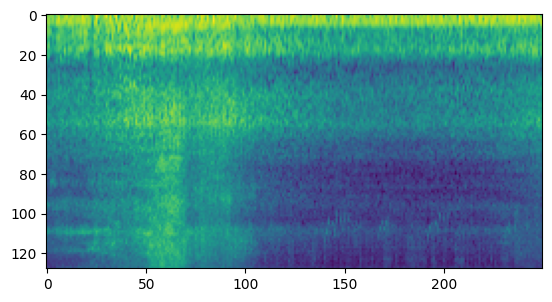

In [ ]:
plt.imshow(spec[0])

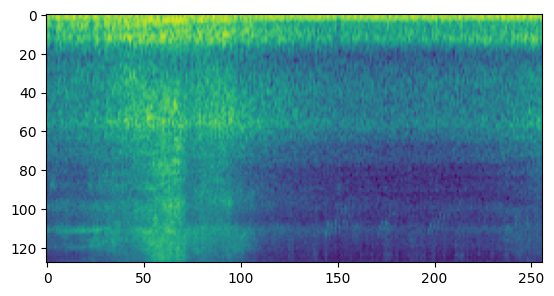

In [ ]:
plt.imshow(precomputed_spec[0])

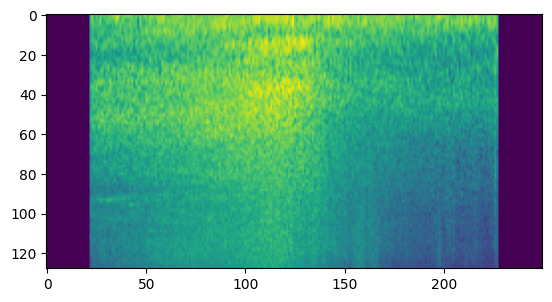

In [ ]:
extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10)
bg_n = AddBackgroundNoise("/media/magalhaes/ESC-50/audio/1-17367-A-10.wav", p=1.0)
g_n = AddGaussianSNR(min_snr_in_db=3.0, max_snr_in_db=30.0, p=1.0)
# /media/magalhaes/schreder_sound/15_12_2022/2022-12-15 17_44_09.093523+00_00.wav
# /media/magalhaes/schreder_sound/16_12_2022/2022-12-16 12_08_17.258960+00_00.wav

# Car and motorcycle
# /media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_18_54.006322+00_00.wav
# Car 
# 
# Motorcycle
# /media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_19_42.821944+00_00.wav

waveform = load_audio("/media/magalhaes/FSD50K/dev_audio/365219.wav").numpy()
spec = extractor(torch.Tensor(waveform))[0]

plt.imshow(spec)
display(Audio(waveform, rate=22050))

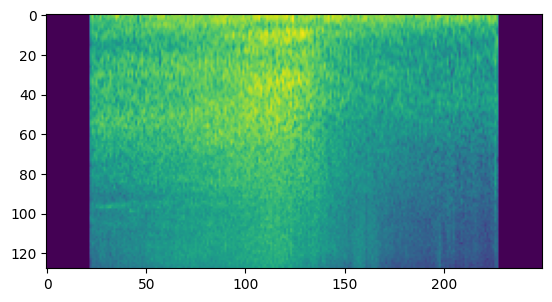

In [ ]:
extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10, export=True)

waveform = load_audio("/media/magalhaes/FSD50K/dev_audio/365219.wav").numpy()
spec = extractor(torch.Tensor(waveform))[0]

plt.imshow(spec)
display(Audio(waveform, rate=22050))

tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])
tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])
tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])
tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])
tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])
tensor([[[-0.0478, -0.0741, -0.0722,  ..., -0.0202, -0.0157, -0.0229]]])


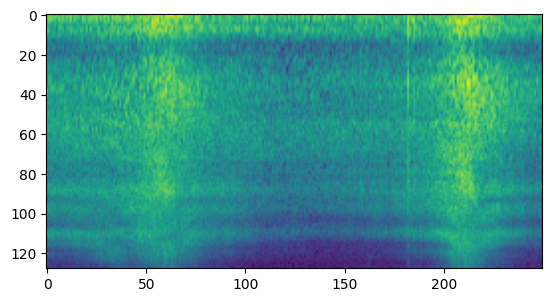

In [ ]:

extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10, export=True)

waveform = load_audio("/media/magalhaes/schreder_sound/13_04_2023/2023-04-13 21_45_15.636225+00_00.wav").numpy()
spec = extractor(torch.Tensor(waveform))[0]

plt.imshow(spec)
display(Audio(waveform, rate=22050))

In [ ]:
librosa.filters.mel(
            sr=22050, n_fft=2205, n_mels=128, fmin=0.0, fmax=None
        ).T.shape

(1103, 128)

In [ ]:
import torchaudio.functional as AF

AF.melscale_fbanks(128 // 2 + 1, 0.0, float(22050 // 2), 128, 22050).shape

torch.Size([65, 128])

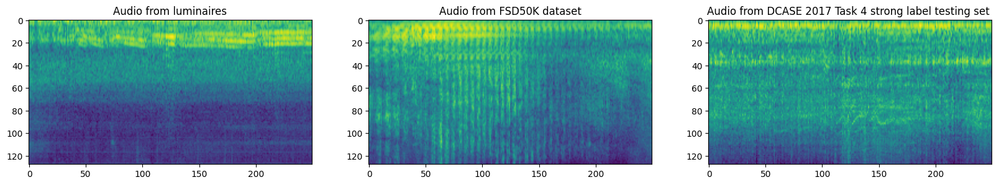

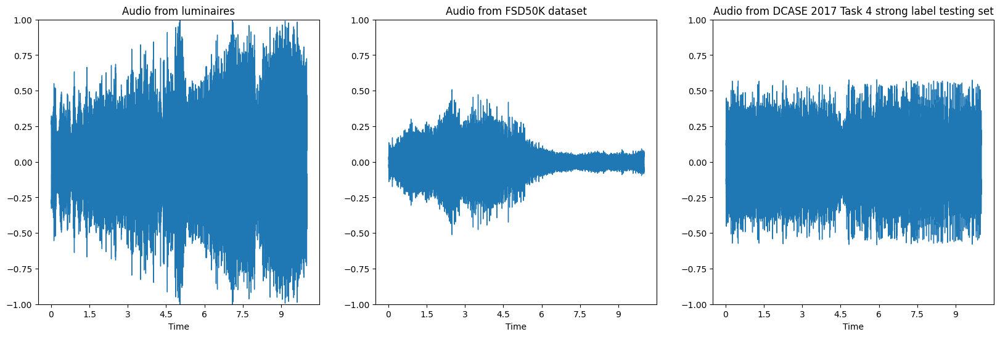

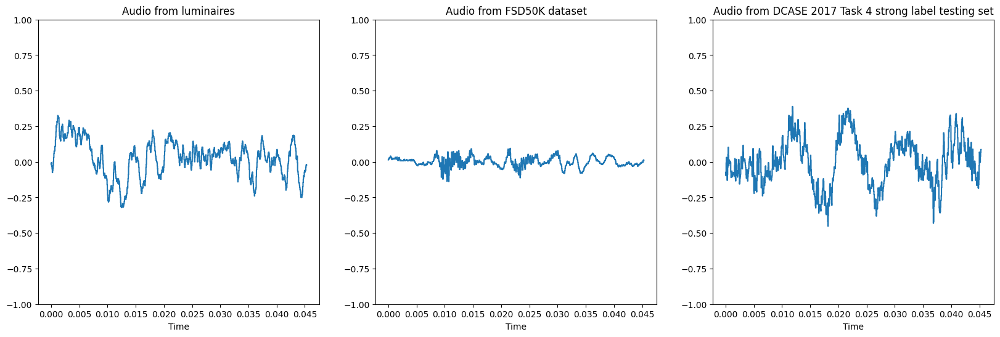

In [ ]:
waveform_schreder = load_audio("/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_19_42.821944+00_00.wav")
spec_schreder = extractor(waveform_schreder)[0]

waveform_fsd50k = load_audio("/media/magalhaes/FSD50K/dev_audio/98538.wav")
spec_fsd50k = extractor(waveform_fsd50k)[0]


waveform_dcase = load_audio("/media/magalhaes/DCASE2017/testing_set/Y-P7iW3WzNfc_400.000_410.000.wav")
spec_dcase = extractor(waveform_dcase)[0]


fig, axs = plt.subplots(1, 3, figsize=(20, 10))

axs[0].imshow(spec_schreder)
axs[0].set_title("Audio from luminaires")
axs[1].imshow(spec_fsd50k)
axs[1].set_title("Audio from FSD50K dataset")
axs[2].imshow(spec_dcase)
axs[2].set_title("Audio from DCASE 2017 Task 4 strong label testing set ")

plt.savefig("audio_spec_visualization.svg", bbox_inches="tight")

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

librosa.display.waveshow(waveform_schreder.numpy(), sr=22050, ax=axs[0])
axs[0].set(title="Audio from luminaires", ylim=(-1, 1))
librosa.display.waveshow(waveform_fsd50k.numpy(), sr=22050, ax=axs[1])
axs[1].set(title="Audio from FSD50K dataset", ylim=(-1, 1))
librosa.display.waveshow(waveform_dcase.numpy(), sr=22050, ax=axs[2])
axs[2].set(title="Audio from DCASE 2017 Task 4 strong label testing set", ylim=(-1, 1))

plt.savefig("audio_waveform_visualization.svg", bbox_inches="tight")

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

librosa.display.waveshow(waveform_schreder.numpy()[:1000], sr=22050, ax=axs[0])
axs[0].set(title="Audio from luminaires", ylim=(-1, 1))
librosa.display.waveshow(waveform_fsd50k.numpy()[:1000], sr=22050, ax=axs[1])
axs[1].set(title="Audio from FSD50K dataset", ylim=(-1, 1))
librosa.display.waveshow(waveform_dcase.numpy()[:1000], sr=22050, ax=axs[2])
axs[2].set(title="Audio from DCASE 2017 Task 4 strong label testing set", ylim=(-1, 1))

plt.savefig("audio_waveform_short_visualization.svg", bbox_inches="tight")



In [ ]:
loader = Loader(sample_rate=22050)
trimmer = Trimmer(sample_rate=22050, duration=10)
# augmentations = WaveformAugmentations(sample_rate=22050, device="cpu")
padder = Padder(mode="constant", sample_rate=22050, duration=10)
# aug = AddBackgroundNoise(
#     min_snr_in_db=3.0,
#     max_snr_in_db=30.0,
#     noise_transform=PolarityInversion(),
#     p=1.0
# )
# aug = AddGaussianNoise(
#     min_amplitude=0.01,
#     max_amplitude=0.1,
#     p=1.0
# )
aug = PitchShift(
    min_semitones=-8,
    max_semitones=8,
    p=1.0
)
extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10)
# extractor = LogMelSpectrogramExtractorModel(sample_rate=22050, n_mels=128, length=250, duration=10).to("cuda:0")
# normalizer = MinMaxNormalizer(min=0.0, max=1.0)
spec_aug = TA_T.FrequencyMasking(freq_mask_param=20, iid_masks=True)

def preprocess(path, a=0, b=""):
    original_sr = librosa.get_samplerate(path)
    print(f"Original sample rate: {original_sr}")
    fig, axs = plt.subplots(3, figsize=(10,5), sharex=True)
    signal = loader(path)
    signal = trimmer(signal)
    signal = padder(signal)
    print(f"Audio time series shape: {signal.shape[0]}")
    librosa.display.waveshow(signal.numpy(), ax=axs[0])
    axs[0].set(title='Audio time series BEFORE augmentation')
    
    print("Sound before augmentation")
    display(Audio(signal, rate=22050))
    
    signal = torch.from_numpy(aug(signal.numpy(), sample_rate=22050))
    librosa.display.waveshow(signal.numpy(), ax=axs[1])
    axs[1].set(title='Audio time series AFTER augmentation')
    
    print("Sound after augmentation")
    display(Audio(signal, rate=22050))
    
    librosa.display.waveshow(signal.numpy(), ax=axs[2])
    # axs[2].set(title='Audio time series AFTER pitch shifting')
    plt.tight_layout()
    fig.show()

    # librosa.display.waveshow(signal, ax=xs[a])
    # xs[a].set(title=f'Audio time series from {b}')
    # fig.show()

    fig, axs = plt.subplots(2,2)

    spectgrms = extractor(signal)
    # norm_spectgrms = normalizer(spectgrms).numpy()
    print(f"Normalized Log Mel Spectogram shape: {np.array(spectgrms).shape}")
    axs[0,0].imshow(np.einsum("chw->hwc", np.array(spectgrms)))
    axs[0,0].set(title="3 channel log MelSpectogram")
    spectgrms  = spec_aug(spectgrms)
    axs[0,1].imshow(np.array(spectgrms[0]))
    axs[0,1].set(title="Channel 1")
    axs[1,0].imshow(np.array(spectgrms[1]))
    axs[1,0].set(title="Channel 2")
    axs[1,1].imshow(np.array(spectgrms[2]))
    axs[1,1].set(title="Channel 3")


    return spectgrms

## Schreder

In [ ]:
# f, xs = plt.subplots(2, figsize=(10,5), sharex=True)
# b = preprocess("/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_47_42.256860+00_00.wav", b="Schréder")
# c = preprocess("/media/magalhaes/FSD50K/dev_audio/113319.wav", a=1, b="FSD50K")
# f.tight_layout()
# f.show()



Original sample rate: 48000
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


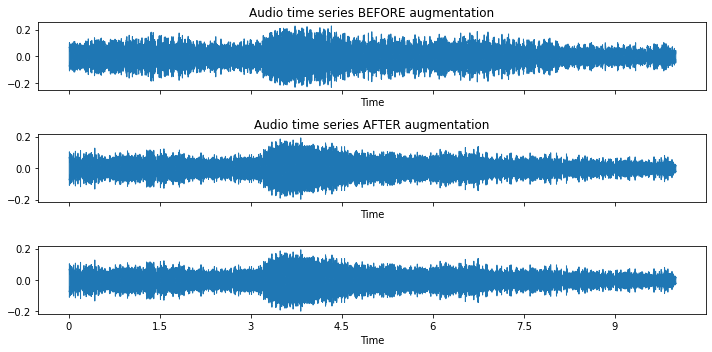

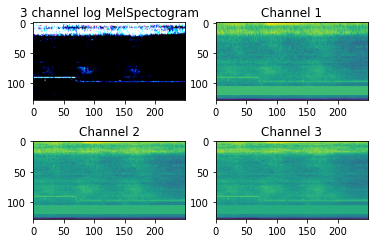

In [ ]:
b = preprocess("/media/magalhaes/schreder_sound/16_12_2022/2022-12-16 12_08_58.208239+00_00.wav")

Original sample rate: 48000
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


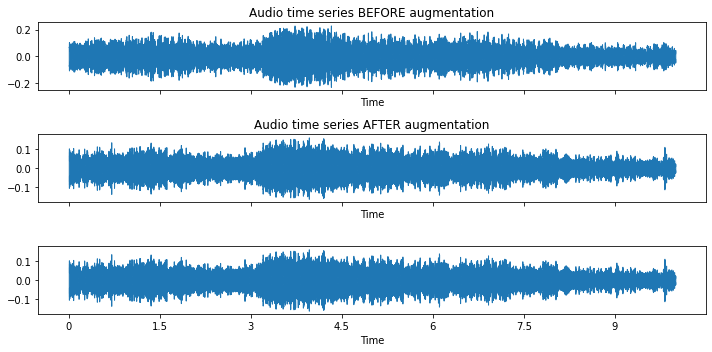

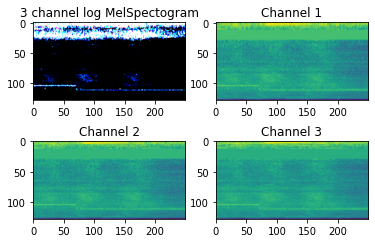

In [ ]:
b = preprocess("/media/magalhaes/schreder_sound/16_12_2022/2022-12-16 12_08_58.208239+00_00.wav")

Original sample rate: 48000
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


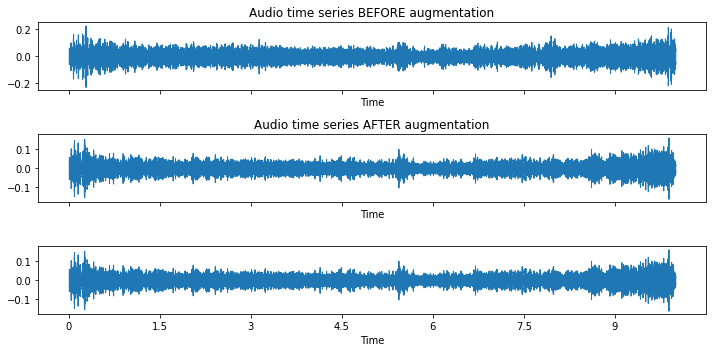

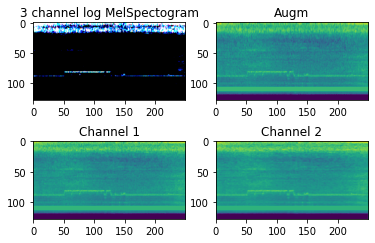

In [ ]:
b = preprocess("/media/magalhaes/schreder_sound/16_12_2022/2022-12-16 12_17_37.036645+00_00.wav")

## DCASE 2017

Original sample rate: 44100
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


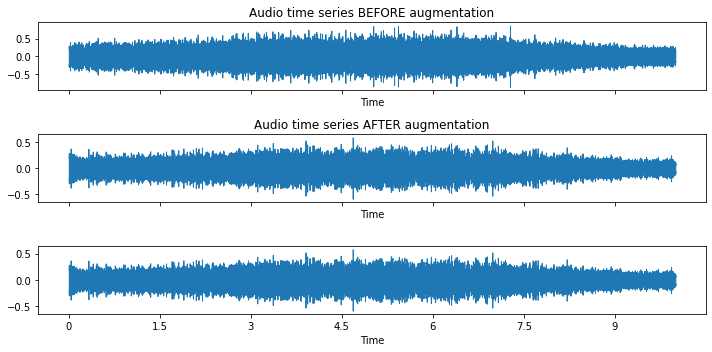

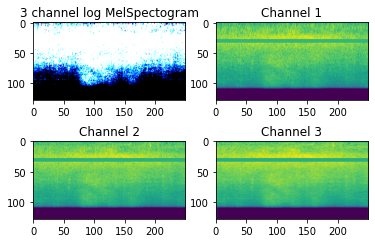

In [ ]:
c = preprocess("/media/magalhaes/DCASE2017/testing_set/Y-10fWp7Pqs4_30.000_40.000.wav")


## FSD50K

Original sample rate: 44100
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


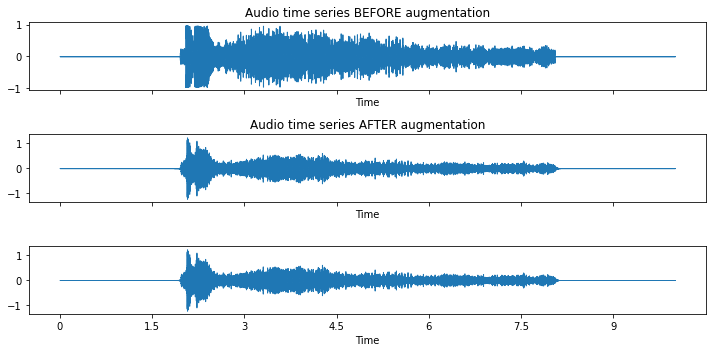

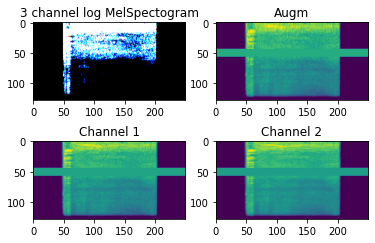

In [ ]:
c = preprocess("/media/magalhaes/FSD50K/dev_audio/113319.wav")

Original sample rate: 44100
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


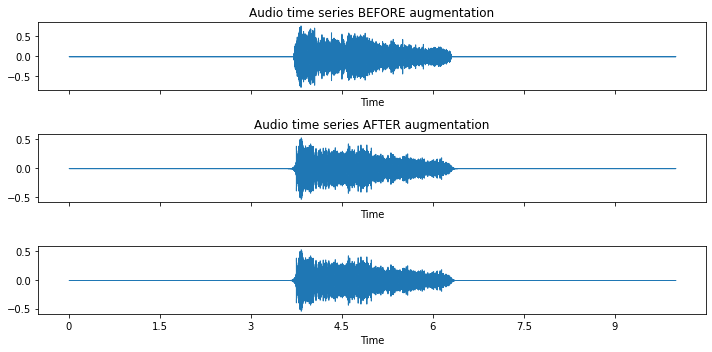

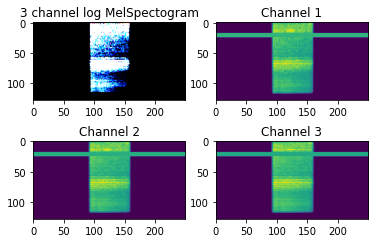

In [ ]:
c = preprocess("/media/magalhaes/FSD50K/dev_audio/49974.wav")


## Alsamixer

Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


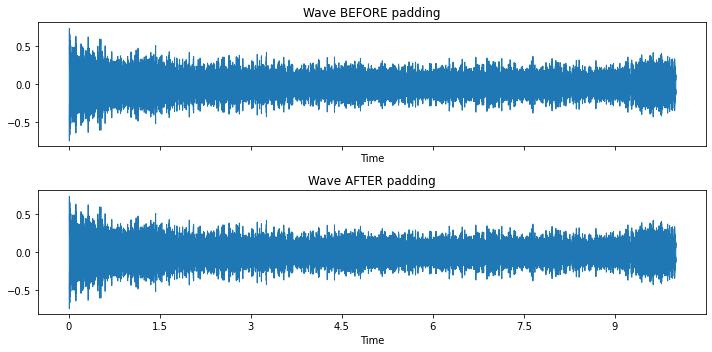

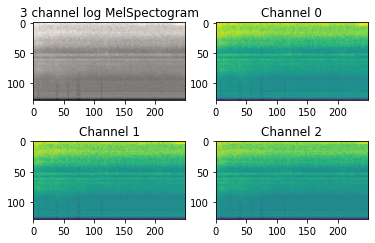

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/alsamixer/capture (Gain [0 ; 12] dB)/1. default [Capture 40-40 (12.0 dB); ALC Max 100 ; Left and Right Input Boost 100]/2022-10-20 14_51_24.787095+00_00.wav")

Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


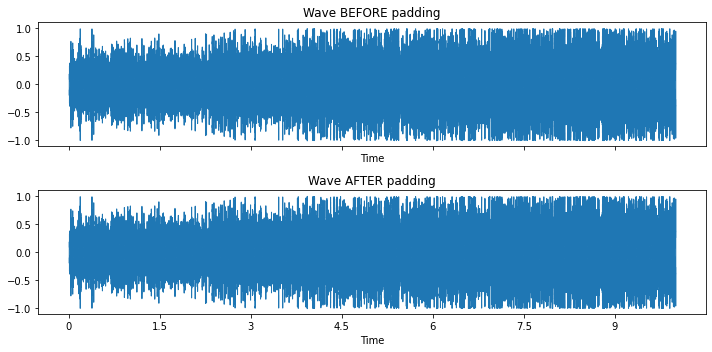

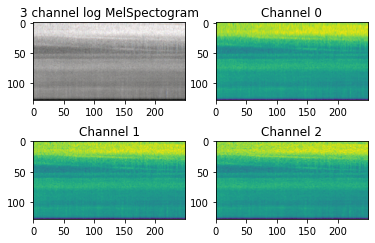

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/alsamixer/capture (Gain [0 ; 12] dB)/4. Capture Decreased [Capture 25-25 (6.00 dB); ALC Max 100 ; Left and Right Input Boost 100]/2022-10-20 15_57_50.907075+00_00.wav")

## GORE Vents

Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


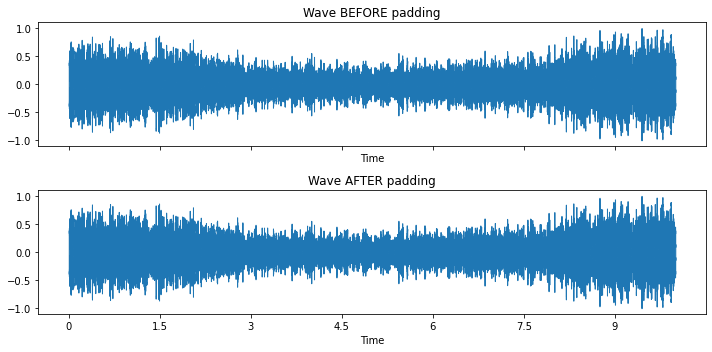

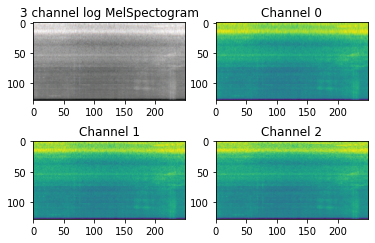

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/GORE Vents Tests/Audio + Classifications + Grounth Truth/Without Filter vs With GORE AVP 2343.060.0/[Audio + Class] With GORE AVP 2343.06.0/2022-09-30 15_54_35.708971+00_00.wav")

Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


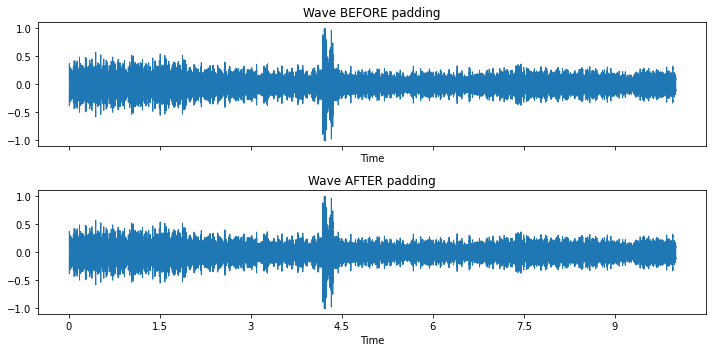

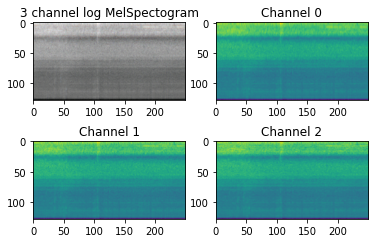

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/GORE Vents Tests/Audio + Classifications + Grounth Truth/Without Filter vs With GORE AVP 2343.060.0/[Audio + Class] Without Filter/2022-09-30 15_55_10.549277+00_00.wav")


Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


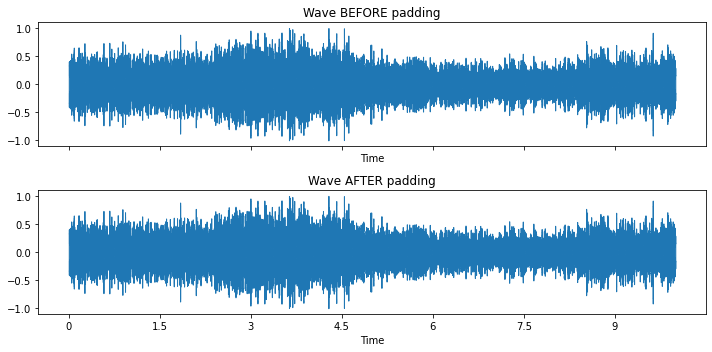

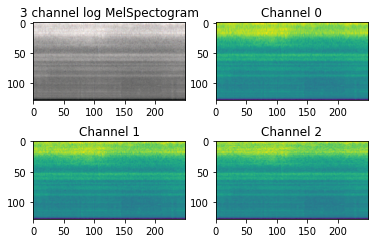

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/GORE Vents Tests/Audio + Classifications + Grounth Truth/Without Filter vs With GORE AVP 4343.060.0/[Audio + Class] With GORE AVP 4343.060.0/2022-10-07 16_17_44.703473+00_00.wav")

Original sample rate: 48000
Audio time series shape: (220500,)
Normalized Log Mel Spectogram shape: (3, 128, 250)


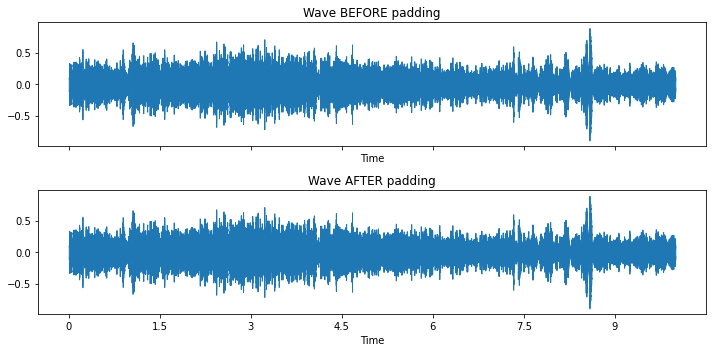

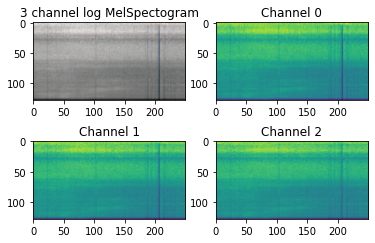

In [ ]:
d = preprocess("/media/magalhaes/schreder_sound/GORE Vents Tests/Audio + Classifications + Grounth Truth/Without Filter vs With GORE AVP 4343.060.0/[Audio + Class] Without Filter/2022-10-07 16_16_41.980572+00_00.wav")

## Audiomentations

### Gaussian Noise

Original sample rate: 48000
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


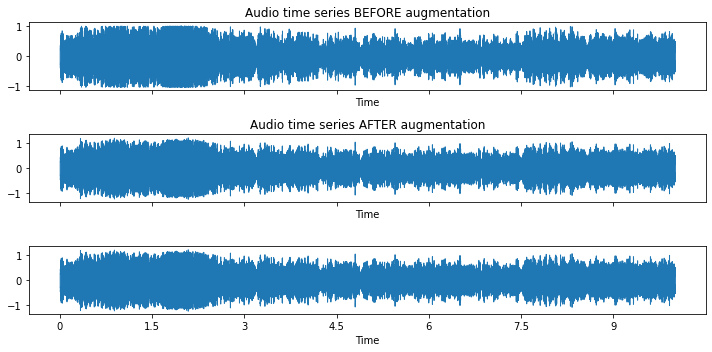

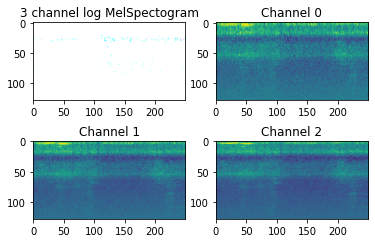

In [ ]:
b = preprocess("/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_47_42.256860+00_00.wav")

Original sample rate: 44100
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


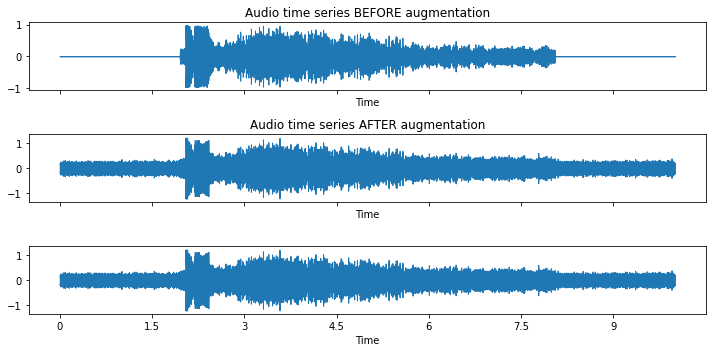

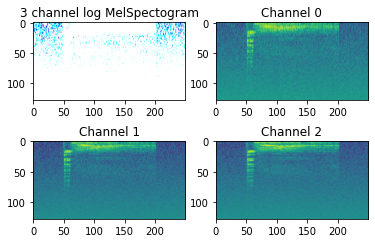

In [ ]:
c = preprocess("/media/magalhaes/FSD50K/dev_audio/113319.wav")


### Pitch Shift

Original sample rate: 48000
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


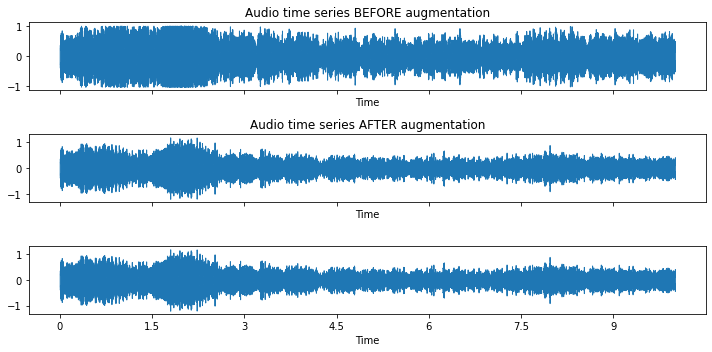

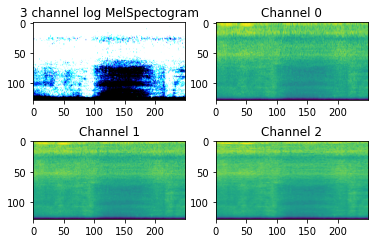

In [ ]:
b = preprocess("/media/magalhaes/schreder_sound/22_9_2022/2022-09-22 10_47_42.256860+00_00.wav")

Original sample rate: 44100
Audio time series shape: 220500
Sound before augmentation


Sound before augmentation


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Normalized Log Mel Spectogram shape: (3, 128, 250)


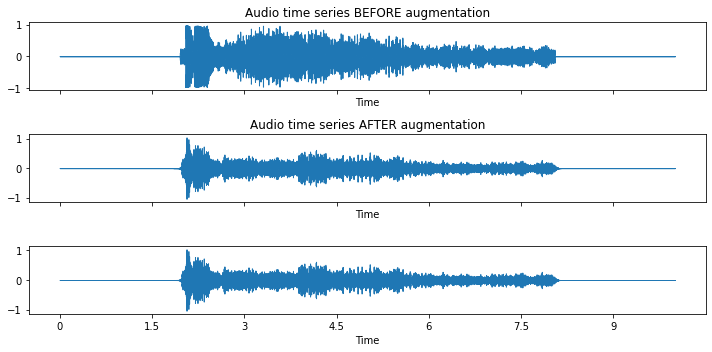

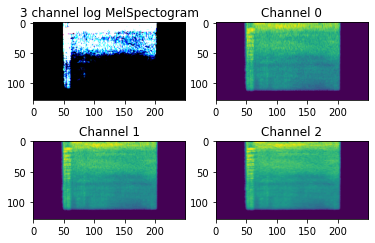

In [ ]:
c = preprocess("/media/magalhaes/FSD50K/dev_audio/113319.wav")
